<h1 style="font-size:30px"><span style="color:red;">TOXICITY</span> INSPECTOR</h1>
<h3>DS 862: Final Project</h3>
<h4>Submitted By:</h4>
<ul>
    <li>Hoa Nguyen</li>
    <li>Shailesh Krishna</li>
    <li>Sheetal Kalburgi</li>
</ul>

![Caution](./caution2.png)

# INTRODUCTION

## 1. Motivation
<p style="font-size:16px">The recent global pandemic situation has forced masses to rely on the internet now more than ever, for activities as simple as online shopping to online education. Toxic comments are detrimental to internet users and limit their freedom of expression in diverse perspectives, and such unconstructive remarks are discourteous, disrespectful, and detestable. Such animosity results in users disabling their comments on many online communities, and eventually, they stop expressing their opinions. Hence, there is a pressing need to build a fast, precise, and deployable solution to help organizations weed out such remarks from getting online.</p>

## 2. Objective
<p style="font-size:16px">At present, there are a plethora of state-of-the-art pre-trained classification models such as BERT are available to us for performing classification. Although these models are very accurate, they are huge and require extensive computational resources for training. Their massive size makes them less useful for deploying them on constricted environments such as mobile devices. Through this project, we aim to learn how to perform multi-label text classification and build a naïve solution that is fast, light-weight, i.e., suitable for deploying in constricted environments, and highly accurate in classifying the comments. </p>

## 3. Dataset
<p style="font-size:16px">Dataset is obtained from Kaggle as a part of the [Toxic Comment Classification Challenge](https://www.kaggle.com/c/jigsaw-toxic-comment-classification-challenge) hosted by Jigsaw/Conversation AI in 2017.</p>
<p style="font-size:16px">The dataset used here is from wiki corpus dataset which was rated by human raters for toxicity. The corpus contains 63M comments from discussions relating to user pages and articles dating from 2004-2015.</p>

<p style="font-size:16px">Different platforms/sites can have different standards for their toxic screening process. Hence the comments are tagged in the following six categories:</p>

* <strong style="font-size:14px">Toxic</strong>
* <strong style="font-size:14px">Severe_toxic</strong>
* <strong style="font-size:14px">Obscene</strong>
* <strong>Threat</strong>
* <strong style="font-size:14px">Insult</strong>
* <strong style="font-size:14px">identity_hate</strong>

<p style="font-size:16px">The tagging is done via crowdsourcing which means that the dataset is rated by different people which in turn implies there is probable cause for low accuracy.</p>


## 4. Overview
**Our notebook is divided into the following sections**
* <strong style="font-size:14px">Data Analysis</strong>: Contains the analysis and work done on the training and test set for text cleaning, determine possible features etc.
* <strong style="font-size:14px">Model Development</strong>: Lists the different approaches and evaluation results for the models built by us.
* <strong style="font-size:14px">Result Analysis</strong>: Illustrates the performance comparision for the models.
* <strong style="font-size:14px">Summary</strong>: Summary of our analysis and findings.


###### Package Imports

In [1]:
import numpy as np
import pandas as pd

# visualizations
from plotly import tools, subplots
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as pio
pio.templates.default = "presentation"
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

# ordered Dictionary
from collections import OrderedDict

# word cloud
from wordcloud import WordCloud, STOPWORDS

# regex
import re

# nltk
from nltk.corpus import stopwords
from nltk import pos_tag
from nltk.stem.wordnet import WordNetLemmatizer 
from nltk.tokenize import word_tokenize   
from nltk.corpus import wordnet

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from skmultilearn.problem_transform import BinaryRelevance
from skmultilearn.problem_transform import ClassifierChain

# score
from sklearn.metrics import hamming_loss
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score

import pickle
import tensorflow as tf
from tensorflow.random import set_seed
set_seed(18)
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Embedding, Dense, Activation,Bidirectional, LSTM, TimeDistributed, Dropout,Input
from tensorflow.python.keras.preprocessing.text import Tokenizer
from tensorflow.python.keras.preprocessing.sequence import pad_sequences
from keras.utils import plot_model

# display options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

# warnings
import warnings
warnings.filterwarnings("ignore")


# DATA ANALYSIS
#### Training Dataset
* In this step, we will check actual data points, data shape and missing values in dataset.

In [2]:
training_dataset = pd.read_csv('train.csv', encoding='utf-8')

In [3]:
# check the shape of the data.
td_row,td_col = training_dataset.shape
print("The total number of rows and columns in the training dataset are: {} and {}".format(td_row,td_col))

The total number of rows and columns in the training dataset are: 159571 and 8


In [4]:
# check for missing values
print("Are there any missing values in the training dataset: {}".format(training_dataset.isnull().values.any()))

Are there any missing values in the training dataset: False


In [5]:
# check the top 10 rows of the dataset
training_dataset.head(10)

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,0000997932d777bf,"Explanation\nWhy the edits made under my username Hardcore Metallica Fan were reverted? They weren't vandalisms, just closure on some GAs after I voted at New York Dolls FAC. And please don't remove the template from the talk page since I'm retired now.89.205.38.27",0,0,0,0,0,0
1,000103f0d9cfb60f,"D'aww! He matches this background colour I'm seemingly stuck with. Thanks. (talk) 21:51, January 11, 2016 (UTC)",0,0,0,0,0,0
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It's just that this guy is constantly removing relevant information and talking to me through edits instead of my talk page. He seems to care more about the formatting than the actual info.",0,0,0,0,0,0
3,0001b41b1c6bb37e,"""\nMore\nI can't make any real suggestions on improvement - I wondered if the section statistics should be later on, or a subsection of """"types of accidents"""" -I think the references may need tidying so that they are all in the exact same format ie date format etc. I can do that later on, if no-one else does first - if you have any preferences for formatting style on references or want to do it yourself please let me know.\n\nThere appears to be a backlog on articles for review so I guess there may be a delay until a reviewer turns up. It's listed in the relevant form eg Wikipedia:Good_article_nominations#Transport """,0,0,0,0,0,0
4,0001d958c54c6e35,"You, sir, are my hero. Any chance you remember what page that's on?",0,0,0,0,0,0
5,00025465d4725e87,"""\n\nCongratulations from me as well, use the tools well. · talk """,0,0,0,0,0,0
6,0002bcb3da6cb337,COCKSUCKER BEFORE YOU PISS AROUND ON MY WORK,1,1,1,0,1,0
7,00031b1e95af7921,"Your vandalism to the Matt Shirvington article has been reverted. Please don't do it again, or you will be banned.",0,0,0,0,0,0
8,00037261f536c51d,"Sorry if the word 'nonsense' was offensive to you. Anyway, I'm not intending to write anything in the article(wow they would jump on me for vandalism), I'm merely requesting that it be more encyclopedic so one can use it for school as a reference. I have been to the selective breeding page but it's almost a stub. It points to 'animal breeding' which is a short messy article that gives you no info. There must be someone around with expertise in eugenics? 93.161.107.169",0,0,0,0,0,0
9,00040093b2687caa,alignment on this subject and which are contrary to those of DuLithgow,0,0,0,0,0,0


#### Test Dataset

In [6]:
test_dataset = pd.read_csv('test.csv', encoding='utf-8')

In [7]:
# check the shape of the data.
test_row,test_col = test_dataset.shape
print("The total number of rows and columns in the test dataset are: {} and {}".format(test_row,test_col))

The total number of rows and columns in the test dataset are: 153164 and 2


In [8]:
# check for missing values
print("Are there any missing values in the test dataset: {}".format(test_dataset.isnull().values.any()))

Are there any missing values in the test dataset: False


In [9]:
test_dataset.head(10)

,id,comment_text
0,00001cee341fdb12,"Yo bitch Ja Rule is more succesful then you'll ever be whats up with you and hating you sad mofuckas...i should bitch slap ur pethedic white faces and get you to kiss my ass you guys sicken me. Ja rule is about pride in da music man. dont diss that shit on him. and nothin is wrong bein like tupac he was a brother too...fuckin white boys get things right next time.,"
1,0000247867823ef7,"== From RfC == \n\n The title is fine as it is, IMO."
2,00013b17ad220c46,""" \n\n == Sources == \n\n * Zawe Ashton on Lapland — / """
3,00017563c3f7919a,":If you have a look back at the source, the information I updated was the correct form. I can only guess the source hadn't updated. I shall update the information once again but thank you for your message."
4,00017695ad8997eb,I don't anonymously edit articles at all.
5,0001ea8717f6de06,Thank you for understanding. I think very highly of you and would not revert without discussion.
6,00024115d4cbde0f,"Please do not add nonsense to Wikipedia. Such edits are considered vandalism and quickly undone. If you would like to experiment, please use the sandbox instead. Thank you. -"
7,000247e83dcc1211,:Dear god this site is horrible.
8,00025358d4737918,""" \n Only a fool can believe in such numbers. \n The correct number lies between 10 000 to 15 000. \n Ponder the numbers carefully. \n\n This error will persist for a long time as it continues to reproduce... The latest reproduction I know is from ENCYCLOPÆDIA BRITANNICA ALMANAC 2008 wich states \n Magnittude: 8.7 (fair enough) \n victims: 70 000 (today 10 000 to 15 000 is not """"a lot"""" so I guess people just come out with a number that impresses enough, I don't know. But I know this: it's just a shameless lucky number that they throw in the air. \n GC \n\n """
9,00026d1092fe71cc,"== Double Redirects == \n\n When fixing double redirects, don't just blank the outer one, you need edit it to point it to the final target, unless you think it's inappropriate, in which case, it needs to be nominated at WP:RfD"


* The training and test dataset contains a total of 159571 and 153164 data points.
* We do not have any null values in both the datasets.

###### Test Labels

In [10]:
test_labels = pd.read_csv('test_labels.csv', encoding='utf-8')

In [11]:
test_labels.head(10)

,id,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,00001cee341fdb12,-1,-1,-1,-1,-1,-1
1,0000247867823ef7,-1,-1,-1,-1,-1,-1
2,00013b17ad220c46,-1,-1,-1,-1,-1,-1
3,00017563c3f7919a,-1,-1,-1,-1,-1,-1
4,00017695ad8997eb,-1,-1,-1,-1,-1,-1
5,0001ea8717f6de06,0,0,0,0,0,0
6,00024115d4cbde0f,-1,-1,-1,-1,-1,-1
7,000247e83dcc1211,0,0,0,0,0,0
8,00025358d4737918,-1,-1,-1,-1,-1,-1
9,00026d1092fe71cc,-1,-1,-1,-1,-1,-1


* -1 in the row indicates it was not used for scoring and does not contain the labels, we need to exclude such rows from the test dataset.

###### Final Test Dataset

In [12]:
final_test_dataset = test_dataset.merge(test_labels,on='id',how='inner')

In [13]:
# filter out the -1 rows
final_test_dataset = final_test_dataset[final_test_dataset['toxic'] != -1]
final_test_dataset.head()

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
5,0001ea8717f6de06,Thank you for understanding. I think very highly of you and would not revert without discussion.,0,0,0,0,0,0
7,000247e83dcc1211,:Dear god this site is horrible.,0,0,0,0,0,0
11,0002f87b16116a7f,"""::: Somebody will invariably try to add Religion? Really?? You mean, the way people have invariably kept adding """"Religion"""" to the Samuel Beckett infobox? And why do you bother bringing up the long-dead completely non-existent """"Influences"""" issue? You're just flailing, making up crap on the fly. \n ::: For comparison, the only explicit acknowledgement in the entire Amos Oz article that he is personally Jewish is in the categories! \n\n """,0,0,0,0,0,0
13,0003e1cccfd5a40a,""" \n\n It says it right there that it IS a type. The """"Type"""" of institution is needed in this case because there are three levels of SUNY schools: \n -University Centers and Doctoral Granting Institutions \n -State Colleges \n -Community Colleges. \n\n It is needed in this case to clarify that UB is a SUNY Center. It says it even in Binghamton University, University at Albany, State University of New York, and Stony Brook University. Stop trying to say it's not because I am totally right in this case.""",0,0,0,0,0,0
14,00059ace3e3e9a53,""" \n\n == Before adding a new product to the list, make sure it's relevant == \n\n Before adding a new product to the list, make sure it has a wikipedia entry already, """"proving"""" it's relevance and giving the reader the possibility to read more about it. \n Otherwise it could be subject to deletion. See this article's revision history.""",0,0,0,0,0,0


In [14]:
final_test_dataset.shape

(63978, 8)

###### Toxic Comments vs Clean Comments Count
* Checking the distribution of toxic and non-toxic comments in the training set.

In [15]:
# since a comment can be belong to multiple categories as evident from above, getting row wise count.
sum_per_row = training_dataset.iloc[:,2:].sum(axis=1) 

In [16]:
comments_without_labels= len(sum_per_row[sum_per_row==0]) # clean comments no label associated with them.
comments_with_labels = len(training_dataset) - comments_without_labels

In [17]:
comment_count = [comments_with_labels,comments_without_labels]
comment_distribution = go.Figure([
    go.Bar(
        x=['Class 1 (Toxic)','Class 0 (Non-Toxic)'],
        y=comment_count,
        text=comment_count,
        textposition='outside',
        marker_color=['crimson','forestgreen']
    )
])
comment_distribution.update_layout(
    title='Toxic vs Non-Toxic Comment Count',
    xaxis_title='Label Type',
    yaxis_title='Count',
    width=500,
    height=500,
    font=dict(size=10)
)
comment_distribution.show()

* The plot above clearly depicts the class imbalance within the dataset.
* The majority of the data points (143346) belong to Class 0 (Non-Toxic) comments, and only 16225 belong to Class 1 (Toxic) comments. 
* Next, within toxic comment, we check the distribution of labeled comments (e.g. Severe_Toxic, Obscene, Threat, Insult, and Identity_Hate).

###### Toxic Comment Types

In [18]:
# extract the names of the columns containing labels
comment_column_names = list(training_dataset.columns[2:])

In [19]:
count_dictionary = OrderedDict() # store the count for individual classes
class_1_labels = 0
for col_name in comment_column_names:
    class_1_labels += len([item for item in training_dataset[col_name] if item == 1])
    count_dictionary[col_name.title()] = len([item for item in training_dataset[col_name] if item == 1])

In [20]:
clrs = px.colors.sequential.Plasma

In [21]:
layout = go.Layout( margin=go.layout.Margin( l=300 ) )
x_val = list(count_dictionary.keys())
y_val = list(count_dictionary.values())
cat_label_count = go.Figure([go.Bar(x=x_val, 
                            y=y_val,
                            text=y_val,
                            textposition='outside',
                            marker_color=clrs)
                            ])
cat_label_count.update_layout(title='Toxic comments per category', xaxis_title='Categories', yaxis_title='Count', width=650, height=500, font=dict(size=10), xaxis={'categoryorder':'array'})
cat_label_count.show()

* The above plot also depicts the class imbalance within the toxic comment categories.
* Majority of the comments are labeled as toxic (15294).
* This can affect our evaluation for multi-labeled classifier.

###### Multi Label Comments?
* Checking if a comment has been assigned multiple labels.

In [22]:
# check if the comment has been labeled twice.
print('Does the dataset contains comments having multiple labels?: {}'.format(int(comments_with_labels) != int(class_1_labels)))

Does the dataset contains comments having multiple labels?: True


###### Common Words in Toxic Comments
* As a comment could be assigned multiple labels, we check the most frequent words to see if they are common to all the categories.
* We utilize WordCloud to visualize it.

In [23]:
# six categories
toxic_comments_text = training_dataset[training_dataset.toxic == 1]['comment_text'].values
severe_toxic_comments_text = training_dataset[training_dataset.severe_toxic == 1]['comment_text'].values
obscene_comments_text = training_dataset[training_dataset.obscene == 1]['comment_text'].values
threat_comments_text = training_dataset[training_dataset.threat == 1]['comment_text'].values
insult_comments_text = training_dataset[training_dataset.insult == 1]['comment_text'].values
identity_hate_comments_text = training_dataset[training_dataset.identity_hate == 1]['comment_text'].values

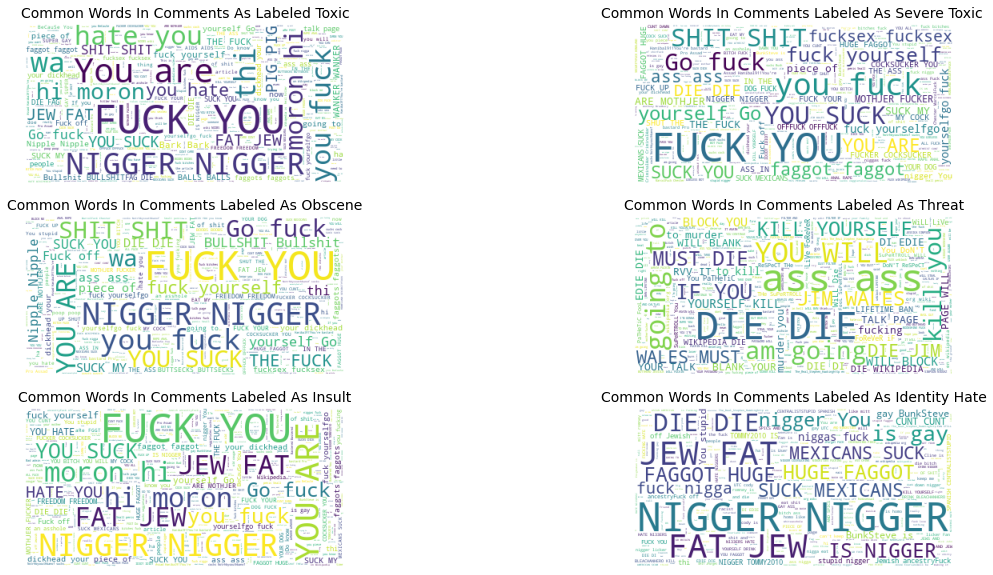

In [24]:
wordcloud_stopword=set(STOPWORDS)

plt.figure(figsize=(20,10))
# toxic
plt.subplot(321)
toxic_comments_wordcloud = WordCloud(min_font_size = 2, max_font_size = 50, font_step=1, max_words=1000, background_color = "white",stopwords=wordcloud_stopword).generate("".join(toxic_comments_text)) 
plt.axis("off")
plt.title("Common Words In Comments As Labeled Toxic", fontsize=14)
plt.imshow(toxic_comments_wordcloud)

# severe toxic
plt.subplot(322)
severe_toxic_comments_wordcloud = WordCloud(min_font_size = 2, max_font_size = 50, font_step=1, max_words=1000, background_color = "white",stopwords=wordcloud_stopword).generate("".join(severe_toxic_comments_text)) 
plt.axis("off")
plt.title("Common Words In Comments Labeled As Severe Toxic ", fontsize=14)
plt.imshow(severe_toxic_comments_wordcloud)

# obscene
plt.subplot(323)
obscene_comments_wordcloud = WordCloud(min_font_size = 2, max_font_size = 50, font_step=1, max_words=1000, background_color = "white",stopwords=wordcloud_stopword).generate("".join(obscene_comments_text)) 
plt.axis("off")
plt.title("Common Words In Comments Labeled As Obscene", fontsize=14)
plt.imshow(obscene_comments_wordcloud)

# threat
plt.subplot(324)
threat_comments_wordcloud = WordCloud(min_font_size = 2, max_font_size = 50, font_step=1, max_words=1000, background_color = "white",stopwords=wordcloud_stopword).generate("".join(threat_comments_text)) 
plt.axis("off")
plt.title("Common Words In Comments Labeled As Threat", fontsize=14)
plt.imshow(threat_comments_wordcloud)

# insult
plt.subplot(325)
insult_comments_wordcloud = WordCloud(min_font_size = 2, max_font_size = 50, font_step=1, max_words=1000, background_color = "white",stopwords=wordcloud_stopword).generate("".join(insult_comments_text)) 
plt.axis("off")
plt.title("Common Words In Comments Labeled As Insult", fontsize=14)
plt.imshow(insult_comments_wordcloud)

# identity hate
plt.subplot(326)
identity_hate_comments_wordcloud = WordCloud(min_font_size = 2, max_font_size = 50, font_step=1, max_words=1000, background_color = "white",stopwords=wordcloud_stopword).generate("".join(identity_hate_comments_text)) 
plt.axis("off")
plt.title("Common Words In Comments Labeled As Identity Hate", fontsize=14)
plt.imshow(identity_hate_comments_wordcloud)

plt.show()

* The word clouds generated above depicts that most of the words across categories are similar, indicating that there may be a correlation between the labels.

###### Correlation Among Labels

In [25]:
# word clouds above indicate that the subcategories may be correlated. Since most of the comments have label toxic, checking the correlation between toxic and other labels.
correlation_matrices = list()
correlation_dataset = training_dataset[sum_per_row != 0]
for col_name in training_dataset.columns[2:]:
    confusion_matrix = pd.crosstab(correlation_dataset['toxic'], correlation_dataset[col_name])
    correlation_matrices.append(confusion_matrix)
# generate df
correlation_df = pd.concat(correlation_matrices,axis=1,keys=training_dataset.columns[2:])

In [26]:
correlation_df

toxic        severe_toxic       obscene       threat      insult        \
toxic     0      1            0     1       0     1      0    1      0     1   
toxic                                                                          
0       931      0          931     0     408   523    902   29    398   533   
1         0  15294        13699  1595    7368  7926  14845  449   7950  7344   

      identity_hate        
toxic             0     1  
toxic                      
0               828   103  
1             13992  1302

* The above correlation matrix supports our hypothesis about the correlation amongst the labels. 
* A comment labeled as severe toxic is always labeled as toxic as well. Other label subcategories are also labeled as toxic, barring few exceptions.

In [27]:
# adding a column that contains all the labels assigned to one column as a list.
training_dataset['all_labels'] = ''
for i in range(len(training_dataset)):
    labels = list()
    if int(training_dataset['toxic'][i]) == 1:
        labels.append('toxic')
    if int(training_dataset['severe_toxic'][i]) == 1:
        labels.append('severe_toxic')
    if int(training_dataset['obscene'][i]) == 1:
        labels.append('obscene')
    if int(training_dataset['threat'][i]) == 1:
        labels.append('threat')
    if int(training_dataset['insult'][i]) == 1:
        labels.append('insult')
    if int(training_dataset['identity_hate'][i]) == 1:
        labels.append('identity_hate')
    training_dataset['all_labels'][i] = labels
    

* **The snapshot of the training dataset below illustrates the multi label behaviour.**

In [28]:
training_dataset[(training_dataset['toxic'] == 1) | (training_dataset['threat'] == 1)].iloc[:,1:].head(5)

,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,all_labels
6,COCKSUCKER BEFORE YOU PISS AROUND ON MY WORK,1,1,1,0,1,0,"[toxic, severe_toxic, obscene, insult]"
12,"Hey... what is it..\n@ | talk .\nWhat is it... an exclusive group of some WP TALIBANS...who are good at destroying, self-appointed purist who GANG UP any one who asks them questions abt their ANTI-SOCIAL and DESTRUCTIVE (non)-contribution at WP?\n\nAsk Sityush to clean up his behavior than issue me nonsensical warnings...",1,0,0,0,0,0,[toxic]
16,"Bye! \n\nDon't look, come or think of comming back! Tosser.",1,0,0,0,0,0,[toxic]
42,"You are gay or antisemmitian? \n\nArchangel WHite Tiger\n\nMeow! Greetingshhh!\n\nUh, there are two ways, why you do erased my comment about WW2, that holocaust was brutally slaying of Jews and not gays/Gypsys/Slavs/anyone...\n\n1 - If you are anti-semitian, than shave your head bald and go to the skinhead meetings!\n\n2 - If you doubt words of the Bible, that homosexuality is a deadly sin, make a pentagram tatoo on your forehead go to the satanistic masses with your gay pals!\n\n3 - First and last warning, you fucking gay - I won't appreciate if any more nazi shwain would write in my page! I don't wish to talk to you anymore!\n\nBeware of the Dark Side!",1,0,1,0,1,1,"[toxic, obscene, insult, identity_hate]"
43,"FUCK YOUR FILTHY MOTHER IN THE ASS, DRY!",1,0,1,0,1,0,"[toxic, obscene, insult]"


### Text Features Analysis
* We analyzed the text to determine the features that could be utilized for model building, if any.

###### Text Cleaning
* Upon checking the dataset, we found that the data contains many new lines, punctuations, and multiple spaces.
* We preprocessed the data to remove stop words, new lines, punctuations, numbers, single characters, and multiple spaces.

In [29]:
# Sample text
training_dataset['comment_text'].head(5)

0                                                                                                                                                                                                                                                                                                                                                                             Explanation\nWhy the edits made under my username Hardcore Metallica Fan were reverted? They weren't vandalisms, just closure on some GAs after I voted at New York Dolls FAC. And please don't remove the template from the talk page since I'm retired now.89.205.38.27
1                                                                                                                                                                                                                                                                                                                                                                               

In [30]:
# regex pattern for removing stop words
remove_stop_words = re.compile(r'\b(' + r'|'.join(stopwords.words('english')) + r')\b\s*')
def clean_comment_text(comment):
    # remove stop words
    processed_comment = remove_stop_words.sub('',comment)
    # strip newlines if any
    processed_comment = processed_comment.rstrip('\r\n')
    # remove punctuations and numbers
    processed_comment = re.sub('[^a-zA-Z]', ' ', processed_comment)
    # remove single characters
    processed_comment = re.sub(r"\s+[a-zA-Z]\s+", ' ', processed_comment)
    # remove multiple spaces
    processed_comment = re.sub(r'\s+', ' ', processed_comment)
    
    return processed_comment

In [31]:
# Clean training dataset
training_dataset['cleaned_comment_text'] = training_dataset['comment_text'].apply(clean_comment_text)

In [32]:
# original vs cleaned comment
training_dataset[['comment_text','cleaned_comment_text']].head(10)

,comment_text,cleaned_comment_text
0,"Explanation\nWhy the edits made under my username Hardcore Metallica Fan were reverted? They weren't vandalisms, just closure on some GAs after I voted at New York Dolls FAC. And please don't remove the template from the talk page since I'm retired now.89.205.38.27",Explanation Why edits made username Hardcore Metallica Fan reverted They vandalisms closure GAs voted New York Dolls FAC And please remove template talk page since retired
1,"D'aww! He matches this background colour I'm seemingly stuck with. Thanks. (talk) 21:51, January 11, 2016 (UTC)",D aww He matches background colour seemingly stuck Thanks talk January UTC
2,"Hey man, I'm really not trying to edit war. It's just that this guy is constantly removing relevant information and talking to me through edits instead of my talk page. He seems to care more about the formatting than the actual info.",Hey man really trying edit war It guy constantly removing relevant information talking edits instead talk page He seems care formatting actual info
3,"""\nMore\nI can't make any real suggestions on improvement - I wondered if the section statistics should be later on, or a subsection of """"types of accidents"""" -I think the references may need tidying so that they are all in the exact same format ie date format etc. I can do that later on, if no-one else does first - if you have any preferences for formatting style on references or want to do it yourself please let me know.\n\nThere appears to be a backlog on articles for review so I guess there may be a delay until a reviewer turns up. It's listed in the relevant form eg Wikipedia:Good_article_nominations#Transport """,More make real suggestions improvement wondered section statistics later subsection types accidents think references may need tidying exact format ie date format etc later one else first preferences formatting style references want please let know There appears backlog articles review guess may delay reviewer turns It listed relevant form eg Wikipedia Good article nominations Transport
4,"You, sir, are my hero. Any chance you remember what page that's on?",You sir hero Any chance remember page
5,"""\n\nCongratulations from me as well, use the tools well. · talk """,Congratulations well use tools well talk
6,COCKSUCKER BEFORE YOU PISS AROUND ON MY WORK,COCKSUCKER BEFORE YOU PISS AROUND ON MY WORK
7,"Your vandalism to the Matt Shirvington article has been reverted. Please don't do it again, or you will be banned.",Your vandalism Matt Shirvington article reverted Please banned
8,"Sorry if the word 'nonsense' was offensive to you. Anyway, I'm not intending to write anything in the article(wow they would jump on me for vandalism), I'm merely requesting that it be more encyclopedic so one can use it for school as a reference. I have been to the selective breeding page but it's almost a stub. It points to 'animal breeding' which is a short messy article that gives you no info. There must be someone around with expertise in eugenics? 93.161.107.169",Sorry word nonsense offensive Anyway intending write anything article wow would jump vandalism merely requesting encyclopedic one use school reference selective breeding page almost stub It points animal breeding short messy article gives info There must someone around expertise eugenics
9,alignment on this subject and which are contrary to those of DuLithgow,alignment subject contrary DuLithgow


In [33]:
# Clean test dataset
final_test_dataset['cleaned_comment_text'] = final_test_dataset['comment_text'].apply(clean_comment_text)

In [34]:
# original vs cleaned comment
final_test_dataset[['comment_text','cleaned_comment_text']].head(10)

,comment_text,cleaned_comment_text
5,Thank you for understanding. I think very highly of you and would not revert without discussion.,Thank understanding think highly would revert without discussion
7,:Dear god this site is horrible.,Dear god site horrible
11,"""::: Somebody will invariably try to add Religion? Really?? You mean, the way people have invariably kept adding """"Religion"""" to the Samuel Beckett infobox? And why do you bother bringing up the long-dead completely non-existent """"Influences"""" issue? You're just flailing, making up crap on the fly. \n ::: For comparison, the only explicit acknowledgement in the entire Amos Oz article that he is personally Jewish is in the categories! \n\n """,Somebody invariably try add Religion Really You mean way people invariably kept adding Religion Samuel Beckett infobox And bother bringing long dead completely non existent Influences issue You flailing making crap fly For comparison explicit acknowledgement entire Amos Oz article personally Jewish categories
13,""" \n\n It says it right there that it IS a type. The """"Type"""" of institution is needed in this case because there are three levels of SUNY schools: \n -University Centers and Doctoral Granting Institutions \n -State Colleges \n -Community Colleges. \n\n It is needed in this case to clarify that UB is a SUNY Center. It says it even in Binghamton University, University at Albany, State University of New York, and Stony Brook University. Stop trying to say it's not because I am totally right in this case.""",It says right IS type The Type institution needed case three levels SUNY schools University Centers Doctoral Granting Institutions State Colleges Community Colleges It needed case clarify UB SUNY Center It says even Binghamton University University Albany State University New York Stony Brook University Stop trying say totally right case
14,""" \n\n == Before adding a new product to the list, make sure it's relevant == \n\n Before adding a new product to the list, make sure it has a wikipedia entry already, """"proving"""" it's relevance and giving the reader the possibility to read more about it. \n Otherwise it could be subject to deletion. See this article's revision history.""",Before adding new product list make sure relevant Before adding new product list make sure wikipedia entry already proving relevance giving reader possibility read Otherwise could subject deletion See article revision history
16,this other one from 1897,one
17,"== Reason for banning throwing == \n\n This article needs a section on /why/ throwing is banned. At the moment, to a non-cricket fan, it seems kind of arbitrary.",Reason banning throwing This article needs section throwing banned At moment non cricket fan seems kind arbitrary
19,|blocked]] from editing Wikipedia. |,blocked editing Wikipedia
21,"== Arabs are committing genocide in Iraq, but no protests in Europe. == \n\n May Europe also burn in hell.",Arabs committing genocide Iraq protests Europe May Europe also burn hell
22,"Please stop. If you continue to vandalize Wikipedia, as you did to Homosexuality, you will be blocked from editing.",Please stop If continue vandalize Wikipedia Homosexuality blocked editing


###### Word Count

In [35]:
# Clean comments
clean_comments_text = training_dataset[sum_per_row == 0]['cleaned_comment_text'].values
# Toxic comments
toxic_comments_text = training_dataset[sum_per_row != 0]['cleaned_comment_text'].values

In [36]:
# get the counts
clean_comments_counts = [len(item) for item in clean_comments_text]
toxic_comments_counts = [len(item) for item in toxic_comments_text]

In [37]:
print("Clean Comment Text lengths: Maximum is {} words and Minimum is {} words".format(max(clean_comments_counts), min(clean_comments_counts)))

Clean Comment Text lengths: Maximum is 5000 words and Minimum is 1 words


In [38]:
print("Toxic Comment Text lengths: Maximum is {} words and Minimum is {} words".format(max(toxic_comments_counts), min(toxic_comments_counts)))

Toxic Comment Text lengths: Maximum is 5000 words and Minimum is 4 words


In [39]:
x_words = list(range(1,training_dataset.shape[0]))

In [40]:
clean_comments_count_figure = go.Figure(data=[go.Histogram(x=clean_comments_counts, xbins=dict(start=0,end=5000,size=300), marker_color='forestgreen')])
clean_comments_count_figure.update_layout(title='Number Of Words Per Clean Comment', xaxis_title='Word Count', yaxis_title='Comment Count', width=650, height=500, font=dict(size=10))
clean_comments_count_figure.show()

In [41]:
toxic_comments_count_figure = go.Figure(data=[go.Histogram(x=toxic_comments_counts, xbins=dict(start=0,end=5000,size=300), marker_color='crimson')])
toxic_comments_count_figure.update_layout(title='Number Of Words Per Toxic Comment', xaxis_title='Word Count', yaxis_title='Comment Count', width=650, height=500, font=dict(size=10))
toxic_comments_count_figure.show()

* The above two plots show a similar trend and there is no clear distinction between the word count for clean and toxic comments.

###### Word Count vs Unique Word Count
* There are instances when bots instead of humans post comments online. We are trying to ascertain if there is such a trend in the data which could help us determine it and possibly use it as a feature. The writing style is different for humans. If a bot is writing, there is a good chance of using a template that can have the same content with some variation. Comments synthesized by bots tend to be lexically strong. 
* On the other hand, human-generated comments are more semantically strong and involve texting language. Trend analysis between the number of words and the unique number of words in each comment can distinguish between the two mentioned instances.
* If there is a distinction in the trend, then there is a possibility that the some comments are generated by bots while some by humans. This can, in turn, be an essential feature when performing classification.

In [42]:
words_per_comment = list(training_dataset["cleaned_comment_text"].apply(lambda x: len(str(x).split())))
unique_words_per_comment = list(training_dataset["cleaned_comment_text"].apply(lambda x: len(set(str(x).split()))))
x_words2 = list(range(1,training_dataset.shape[0]))

In [43]:
word_counts = go.Figure(data=[
    go.Scatter(x=x_words2, y=words_per_comment,line = dict(color='#0077bb'), name='Word Count'),
    go.Scatter(x=x_words2, y=unique_words_per_comment,line = dict(color='orange'), name='Unique Word Count')
])
word_counts.update_layout(title='Word Count vs Unique Word Count',xaxis_title='Count', yaxis_title='Categories',height=500, font=dict(size=10))
word_counts.show()

* From the above plot we can see that unique word count is pretty similar across the comments. Hence, we will not be using it as a feature.

# MODEL DEVELOPMENT

### Multi-Class vs Multi-Label
<p style="font-size:16px">The primary difference between then Multi-Class and Multi-Label classification is that there are multiple categories in multi-class classification, but each instance is assigned only one of the categories. However, for multi-label classification, each instance can be assigned with multiple categories, and the categories are somehow related.</p>

<p style="font-size:16px">We experimented with commonly used multi-label classification approach to build our models. They are:</p>

### 1. Problem Transformation
<p style="font-size:16px">In this method, multi-label classification is transformed into single-label classification. This method can be carried out in three different ways as:</p>

##### A. OneVsRest
<p style="font-size:14px">The problem is decomposed into multiple binary classification problems, in which the labels should be mutually exclusive of each other. We pick one class and train a binary classifier with the selected class samples on one side and all the other samples on the other side.</p>

##### B. Binary Relevance
<p style="font-size:14px">This is the simplest technique, which treats each label as a separate single class classification. The response is broken into 6 different single class classification problems, one per class. It is most simple and efficient method but the only drawback is that it doesn’t consider labels correlation because it treats every target variable independently.</p>

![Binary Relevance](./binary_relevance.png)

##### C. Classifier Chains
<p style="font-size:14px">Here, the first classifier is trained on the input data and then each next classifier is trained on the input space and all the previous classifiers in the chain. In classifier chains, this response is transformed into 6 different single label classifier. Although it is quite similar to binary relevance, the only difference is it forms chains in order to preserve label correlation.</p>

![Classifier Chains](./classifier_chain.png)

##### D. Label Powerset
<p style="font-size:14px">In this method, the classifer is transformed into a multi-class problem with one multi-class classifier trained on all unique label combinations found in the training data. So, label powerset gives a unique class to every possible label combination that is present in the training set. The disadvantage of this method is that as the training data increases, number of labels grows exponentially. Thus, increasing the model complexity, and would result in a lower accuracy. In our case, we have nearly 150000 records in the training dat and increasing this size would only impact the model negatively.</p>

![Label Powerset](./label_powerset.png)

### 2. Neural Network Approach
<p style="font-size:16px">Neural network models can be configured to support multi-label classification and perform well, depending on the classification task's specifics. Multi-label classification can be supported directly by neural networks by merely specifying the number of target labels in the problem as the number of nodes in the output layer.</p>
<p style="font-size:16px">For example, a task with three output labels (classes) will require a neural network output layer with three nodes in the output layer. Each node in the output layer must use the sigmoid activation.</p>
<p style="font-size:16px">The NN will predict a probability of class membership for the label, a value between 0 and 1. Finally, the model must be fit with the binary cross-entropy loss function.</p>


### 3. Ensemble Approach
<p style="font-size:16px">Use an ensemble of models to perform classification</p>

###### We experimented with the problem transformation (OneVsRest, Binary Relevance, Classifier Chain) and Neural Network approach. 

### Evaluation Metrics

<ul>
    <li style="font-size:16px">F1 score and Hamming loss are the preferred metrics when dealing with multi-label classification.</li>
    <li style="font-size:16px">Instead of counting number of correctly classified data instance, Hamming Loss calculates loss generated in the bit string of class labels during prediction. In multilabel classification, the Hamming loss is different from the subset zero-one loss. The zero-one loss considers the entire set of labels for a given sample incorrect if it does not entirely match the true set of labels. Hamming loss is more forgiving in that it penalizes only the individual labels. The Hamming loss is upperbounded by the subset zero-one loss, when normalize parameter is set to True. It is always between 0 and 1, lower being better.</li>
    <li style="font-size:16px">F1 score is a weighted harmonic mean of precision and recall normalized between 0 and 1. F score of 1 indicates a perfect balance as precision and the recall are inversely related. A high F1 score is useful where both high recall and precision is important. The macro-average calculates average metric from the aggregate contributions of all classes. Macro-average is used in unbalanced datasets as this method takes the frequency of each class into consideration.</li>
</ul>

#### Define X and y

In [44]:
X = training_dataset['cleaned_comment_text']
y = training_dataset[comment_column_names].values

###### Training/Validation Split

In [45]:
# Split features and response into training and validation data
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=862)

In [46]:
# Define X_test
X_test = final_test_dataset['cleaned_comment_text']

In [47]:
# Define y_test
y_test = final_test_dataset[comment_column_names].values

###### Vectorization using TF-IDF
* We use frequency based word embedding method as tf-idf to convert text to numerical format. 

In [48]:
# Define the TFIDF vectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True,
                                 strip_accents='unicode',
                                 analyzer='word',
                                 token_pattern=r'\w{1,}',
                                 stop_words='english',
                                 ngram_range=(1, 3),
                                )
# Apply on X_train (fit and transform) and X_valid (transform) features
X_train_vectorized = vectorizer.fit_transform(X_train)
X_valid_vectorized = vectorizer.transform(X_valid)

In [49]:
# Similarly, vectorize cleaned comments of the test data
X_test_vectorized = vectorizer.transform(final_test_dataset['cleaned_comment_text'])

In [50]:
# Define y_test from the cleaned comments of the test data
y_test = final_test_dataset[comment_column_names].values

## OneVsRest

### 1. Using Logistic Regression

In [51]:
# Instantiate OneVsRestClassifier using Logistic Regression
ovs_classifier = OneVsRestClassifier(LogisticRegression(class_weight='balanced', C=12, random_state=862),n_jobs=-1)

# Fit on train data
ovs_classifier.fit(X_train_vectorized, y_train)

# Predict on validation data
ovs_predictions = ovs_classifier.predict(X_valid_vectorized)

# Print classification report
print(classification_report(y_valid, ovs_predictions))

              precision    recall  f1-score   support

           0       0.75      0.80      0.77      3083
           1       0.33      0.74      0.45       334
           2       0.76      0.86      0.81      1744
           3       0.31      0.55      0.40        94
           4       0.65      0.81      0.72      1646
           5       0.34      0.67      0.45       271

   micro avg       0.66      0.81      0.72      7172
   macro avg       0.52      0.74      0.60      7172
weighted avg       0.69      0.81      0.74      7172
 samples avg       0.06      0.07      0.07      7172



In [52]:
# Predict on test data
test_ovs_predictions = ovs_classifier.predict(X_test_vectorized)

# Print classification report
print(classification_report(y_test, test_ovs_predictions))

              precision    recall  f1-score   support

           0       0.48      0.89      0.62      6090
           1       0.17      0.82      0.28       367
           2       0.50      0.86      0.63      3691
           3       0.24      0.73      0.36       211
           4       0.45      0.83      0.58      3427
           5       0.33      0.77      0.46       712

   micro avg       0.44      0.86      0.58     14498
   macro avg       0.36      0.82      0.49     14498
weighted avg       0.46      0.86      0.60     14498
 samples avg       0.07      0.08      0.07     14498



In [53]:
print('Hamming Loss for OneVsRest Classifier using Logistic Regression is: {:.2f}'.format(hamming_loss(y_test, test_ovs_predictions)))

Hamming Loss for OneVsRest Classifier using Logistic Regression is: 0.05


In [54]:
print('Accuracy for OneVsRest Classifier using Logistic Regression is: {:.2f}'.format(accuracy_score(y_test, test_ovs_predictions)))

Accuracy for OneVsRest Classifier using Logistic Regression is: 0.84


### 2. Using Multinomial Naïve Bayes

In [55]:
# Instantiate OneVsRestClassifier using MultinomialNB
ovs_classifier_nb = OneVsRestClassifier(MultinomialNB(),n_jobs=-1)

# Fit on train data
ovs_classifier_nb.fit(X_train_vectorized, y_train)

# Predict on validation data
ovs_predictions_nb = ovs_classifier_nb.predict(X_valid_vectorized)

# Print classification report
print(classification_report(y_valid, ovs_predictions_nb))

              precision    recall  f1-score   support

           0       1.00      0.07      0.14      3083
           1       0.00      0.00      0.00       334
           2       0.99      0.04      0.08      1744
           3       0.00      0.00      0.00        94
           4       1.00      0.01      0.01      1646
           5       0.00      0.00      0.00       271

   micro avg       0.99      0.04      0.08      7172
   macro avg       0.50      0.02      0.04      7172
weighted avg       0.90      0.04      0.08      7172
 samples avg       0.01      0.00      0.00      7172



In [56]:
# Predict on test data
test_ovs_predictions_nb = ovs_classifier_nb.predict(X_test_vectorized)

# Print classification report
print(classification_report(y_test, test_ovs_predictions_nb))

              precision    recall  f1-score   support

           0       0.98      0.07      0.12      6090
           1       0.00      0.00      0.00       367
           2       0.98      0.04      0.07      3691
           3       0.00      0.00      0.00       211
           4       1.00      0.00      0.00      3427
           5       0.00      0.00      0.00       712

   micro avg       0.98      0.04      0.07     14498
   macro avg       0.49      0.02      0.03     14498
weighted avg       0.90      0.04      0.07     14498
 samples avg       0.01      0.00      0.00     14498



In [57]:
print('Hamming Loss for OneVsRest Classifier using Multinomial Naïve Bayes is: {:.2f}'.format(hamming_loss(y_test, test_ovs_predictions_nb)))

Hamming Loss for OneVsRest Classifier using Multinomial Naïve Bayes is: 0.04


In [58]:
print('Accuracy for OneVsRest Classifier using Multinomial Naïve Bayes is: {:.2f}'.format(accuracy_score(y_test, test_ovs_predictions_nb)))

Accuracy for OneVsRest Classifier using Multinomial Naïve Bayes is: 0.90


## Binary Relevance

<p style="color:red;">This is the implementation using sklearn library's predefined module for performing Binary Relevance. However, the below code killed the kernel multiple times and is not working. Hence we adopted an alternate approach to evaluate the model performance</p>

In [59]:
#br_classifier = BinaryRelevance(LogisticRegression(class_weight='balanced', C=12, random_state=862),n_jobs=-1)
#br_classifier.fit(X_train_vectorized, y_train)
#br_predictions = br_classifier.predict(X_valid_vectorized)
#print(classification_report(y_valid, br_predictions))

###### Vectorization using TF-IDF

In [60]:
train_text = training_dataset['cleaned_comment_text']
test_text = final_test_dataset['cleaned_comment_text']

tfidf = TfidfVectorizer(
    sublinear_tf=True,
    strip_accents='unicode',
    analyzer='word',
    token_pattern=r'\w{1,}',
    stop_words='english',
    ngram_range=(1, 3),
    max_features=10000)

X_train_2 = tfidf.fit_transform(train_text)
X_test_2 = tfidf.transform(test_text)

In [61]:
toxicity_labels = ['toxic','severe_toxic','obscene','threat','insult','identity_hate']

In [62]:
test_dataset_col_names = list(final_test_dataset.columns[:2])

In [63]:
# make a copy of test data
temp_test_dataset = final_test_dataset.copy()
temp_test_dataset = temp_test_dataset[test_dataset_col_names]
temp_test_dataset.head(2)

,id,comment_text
5,0001ea8717f6de06,Thank you for understanding. I think very highly of you and would not revert without discussion.
7,000247e83dcc1211,:Dear god this site is horrible.


In [64]:
# make a copy of test data to hold predictions
result1 = temp_test_dataset.copy()
result1['toxic'] = ''
result1['severe_toxic'] = ''
result1['obscene'] = ''
result1['threat'] = ''
result1['insult'] = ''
result1['identity_hate'] = ''

result1.shape

result2 = result1.copy()
result3 = result1.copy()
result4 = result1.copy()

In [65]:
# Evaluate model performance
def evaluate_score(y,y_pred,label): 
    print('Printing results for category: {}'.format(label))
    hamm_loss = hamming_loss(y,y_pred)
    print("Hamming Loss:",hamm_loss)
    
    f1 = f1_score(y,y_pred, average='macro')
    print("F1 Score :",f1)

### 1. Using Logistic Regression

In [66]:
clf1 = LogisticRegression(C=12.0) # Instantiate Logistic Regression
for label in toxicity_labels:
    y = training_dataset[label]
    # train model using X_train and y for each class
    model1 = clf1.fit(X_train_2, y)
    # compute evaluation scores for the training set
    y_pred = model1.predict(X_train_2)
    print('-------------------------------------------------------------')
    print('Classification Report for {}'.format(label))
    print(classification_report(y,y_pred))
    y_test_probability = model1.predict_proba(X_test_2)[:,1]
    result1[label] = y_test_probability
    

-------------------------------------------------------------
Classification Report for toxic
              precision    recall  f1-score   support

           0       0.97      0.99      0.98    144277
           1       0.91      0.74      0.81     15294

    accuracy                           0.97    159571
   macro avg       0.94      0.86      0.90    159571
weighted avg       0.97      0.97      0.97    159571

-------------------------------------------------------------
Classification Report for severe_toxic
              precision    recall  f1-score   support

           0       0.99      1.00      1.00    157976
           1       0.74      0.43      0.54      1595

    accuracy                           0.99    159571
   macro avg       0.87      0.71      0.77    159571
weighted avg       0.99      0.99      0.99    159571

-------------------------------------------------------------
Classification Report for obscene
              precision    recall  f1-score   support



In [67]:
result1_values = result1[comment_column_names].values

# transform into required format: convert the probabilities obtained to 0's and 1's using a threshold of 0.5
y_br_lr = list()
for prediction in result1_values:
    temp_list = list()
    for item in prediction:
        if item > float(0.5):
            temp_list.append(1)
        else:
            temp_list.append(0)
    y_br_lr.append(temp_list)

In [68]:
print(classification_report(y_test, y_br_lr))

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      6090
           1       0.38      0.37      0.37       367
           2       0.68      0.69      0.68      3691
           3       0.43      0.33      0.37       211
           4       0.66      0.57      0.61      3427
           5       0.61      0.40      0.48       712

   micro avg       0.61      0.67      0.64     14498
   macro avg       0.55      0.52      0.53     14498
weighted avg       0.61      0.67      0.63     14498
 samples avg       0.07      0.06      0.06     14498



In [69]:
print('Hamming Loss for Binary Relevance Classifier using Logistic Regression is: {:.2f}'.format(hamming_loss(y_test, y_br_lr)))

Hamming Loss for Binary Relevance Classifier using Logistic Regression is: 0.03


In [70]:
print('Accuracy for Binary Relevance Classifier using Logistic Regression is: {:.2f}'.format(accuracy_score(y_test, y_br_lr)))

Accuracy for Binary Relevance Classifier using Logistic Regression is: 0.88


### 2. Using Multinomial Naïve Bayes

In [71]:
clf2 = MultinomialNB() # Instantiate Naive Bayes

for label in toxicity_labels:
    y = training_dataset[label]   
    # train model using X_train and y for each class
    model2 = clf2.fit(X_train_2, y)
    # compute evaluation scores for the training set
    y_pred = model1.predict(X_train_2)
    print('-------------------------------------------------------------')
    print('Classification Report for {}'.format(label))
    print(classification_report(y,y_pred))
    y_test_probability = model2.predict_proba(X_test_2)[:,1]
    result2[label] = y_test_probability

-------------------------------------------------------------
Classification Report for toxic
              precision    recall  f1-score   support

           0       0.91      1.00      0.95    144277
           1       0.96      0.05      0.10     15294

    accuracy                           0.91    159571
   macro avg       0.93      0.53      0.52    159571
weighted avg       0.91      0.91      0.87    159571

-------------------------------------------------------------
Classification Report for severe_toxic
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    157976
           1       0.26      0.13      0.18      1595

    accuracy                           0.99    159571
   macro avg       0.63      0.57      0.59    159571
weighted avg       0.98      0.99      0.99    159571

-------------------------------------------------------------
Classification Report for obscene
              precision    recall  f1-score   support



In [72]:
result2_values = result2[comment_column_names].values
# transform into required format
y_br_nb = list()
for prediction in result2_values:
    temp_list = list()
    for item in prediction:
        if item > float(0.5):
            temp_list.append(1)
        else:
            temp_list.append(0)
    y_br_nb.append(temp_list)

In [73]:
# Classification report for Binary Relevance using Logistic Regression
print(classification_report(y_test, y_br_nb))

              precision    recall  f1-score   support

           0       0.68      0.58      0.63      6090
           1       0.27      0.27      0.27       367
           2       0.77      0.53      0.63      3691
           3       0.01      0.01      0.01       211
           4       0.70      0.44      0.54      3427
           5       0.37      0.12      0.18       712

   micro avg       0.68      0.50      0.57     14498
   macro avg       0.47      0.33      0.38     14498
weighted avg       0.67      0.50      0.57     14498
 samples avg       0.05      0.04      0.04     14498



In [74]:
print('Hamming Loss for Binary Relevance Classifier using Multinomial Naïve Bayes is: {:.2f}'.format(hamming_loss(y_test, y_br_nb)))

Hamming Loss for Binary Relevance Classifier using Multinomial Naïve Bayes is: 0.03


In [75]:
print('Accuracy for Binary Relevance Classifier using Multinomial Naïve Bayes is: {:.2f}'.format(accuracy_score(y_test, y_br_nb)))

Accuracy for Binary Relevance Classifier using Multinomial Naïve Bayes is: 0.90


## Classifier Chain

### 1. Using Logistic Regression

<p style="color:red;">Similar to Binary Relevance, Classifier chain module killed the kernel multiple times and is not working. Hence we adopted an alternate approach to evaluate the model performance</p>

In [76]:
#cc_classifier = ClassifierChain(LogisticRegression(class_weight='balanced', C=12, random_state=862),n_jobs=-1)
#cc_classifier.fit(X_train_vectorized, y_train)
#cc_predictions = cc_classifier.predict(X_valid_vectorized)
#print(classification_report(y_valid, cc_predictions))

In [77]:
# create a function to add features
def add_feature(X, feature_to_add):
    '''
    Returns sparse feature matrix with added feature.
    feature_to_add can also be a list of features.
    '''
    from scipy.sparse import csr_matrix, hstack
    return hstack([X, csr_matrix(feature_to_add).T], 'csr')

# source: - https://www.kaggle.com/rhodiumbeng/classifying-multi-label-comments-0-9741-lb?select=sample_submission.csv.zip

In [78]:
clf3 = LogisticRegression(C = 12.0) # Instantiate Logistic Regression

for label in toxicity_labels:
    y = training_dataset[label]
    # train model using X_train and y for each class
    model3 = clf3.fit(X_train_2,y)
    
    # compute evaluation score
    y_pred = model3.predict(X_train_2)
    
    print('-------------------------------------------------------------')
    print('Classification Report for {}'.format(label))
    print(classification_report(y,y_pred))
    
    # predict on test set 
    y_test = model3.predict(X_test_2)
    y_test_probability = model3.predict_proba(X_test_2)[:,1]
    result3[label] = y_test_probability

    # chain current label to X_train
    X_train_2 = add_feature(X_train_2, y)
    print('New shape of X_train:',X_train_2.shape)
    
    # chain current label predictions to X_test
    X_test_2 = add_feature(X_test_2, y_test)
    print('New shape of X_test:',X_test_2.shape)

-------------------------------------------------------------
Classification Report for toxic
              precision    recall  f1-score   support

           0       0.97      0.99      0.98    144277
           1       0.91      0.74      0.81     15294

    accuracy                           0.97    159571
   macro avg       0.94      0.86      0.90    159571
weighted avg       0.97      0.97      0.97    159571

New shape of X_train: (159571, 10001)
New shape of X_test: (63978, 10001)
-------------------------------------------------------------
Classification Report for severe_toxic
              precision    recall  f1-score   support

           0       0.99      1.00      1.00    157976
           1       0.80      0.47      0.59      1595

    accuracy                           0.99    159571
   macro avg       0.90      0.74      0.80    159571
weighted avg       0.99      0.99      0.99    159571

New shape of X_train: (159571, 10002)
New shape of X_test: (63978, 10002)
---

In [79]:
result3_values = result3[comment_column_names].values
# transform into required format
y_cc_lr = list()
for prediction in result3_values:
    temp_list = list()
    for item in prediction:
        if item > float(0.5):
            temp_list.append(1)
        else:
            temp_list.append(0)
    y_cc_lr.append(temp_list)

In [80]:
y_test = final_test_dataset[comment_column_names].values
print(classification_report(y_test, y_cc_lr))

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      6090
           1       0.37      0.34      0.35       367
           2       0.63      0.71      0.67      3691
           3       0.43      0.32      0.37       211
           4       0.57      0.61      0.59      3427
           5       0.58      0.40      0.47       712

   micro avg       0.58      0.68      0.63     14498
   macro avg       0.52      0.53      0.52     14498
weighted avg       0.58      0.68      0.62     14498
 samples avg       0.07      0.06      0.06     14498



In [81]:
print('Hamming Loss for Classifier Chain Classifier using Logistic Regression is: {:.2f}'.format(hamming_loss(y_test, y_cc_lr)))

Hamming Loss for Classifier Chain Classifier using Logistic Regression is: 0.03


In [82]:
print('Accuracy for Classifier Chain Classifier using Logistic Regression is: {:.2f}'.format(accuracy_score(y_test, y_cc_lr)))

Accuracy for Classifier Chain Classifier using Logistic Regression is: 0.88


### 2. Using Multinomial Naïve Bayes

In [83]:
clf4 = MultinomialNB() # Instantiate Naive Bayes

for label in toxicity_labels:
    y = training_dataset[label]
    # train model using X_train and y for each class
    model4 = clf4.fit(X_train_2,y)
    
    # compute evaluation score
    y_pred = model4.predict(X_train_2)
    
    print('-------------------------------------------------------------')
    print('Classification Report for {}'.format(label))
    print(classification_report(y,y_pred))
    
    # predict on test set 
    y_test = model4.predict(X_test_2)
    y_test_probability = model4.predict_proba(X_test_2)[:,1]
    result4[label] = y_test_probability

    # chain current label to X_train
    X_train_2 = add_feature(X_train_2, y)
    print('New shape of X_train:',X_train_2.shape)
    
    # chain current label predictions to X_test
    X_test_2 = add_feature(X_test_2, y_test)
    print('New shape of X_test:',X_test_2.shape)

-------------------------------------------------------------
Classification Report for toxic
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    144277
           1       0.95      1.00      0.97     15294

    accuracy                           0.99    159571
   macro avg       0.97      1.00      0.98    159571
weighted avg       0.99      0.99      0.99    159571

New shape of X_train: (159571, 10007)
New shape of X_test: (63978, 10007)
-------------------------------------------------------------
Classification Report for severe_toxic
              precision    recall  f1-score   support

           0       1.00      0.97      0.98    157976
           1       0.24      1.00      0.39      1595

    accuracy                           0.97    159571
   macro avg       0.62      0.98      0.69    159571
weighted avg       0.99      0.97      0.98    159571

New shape of X_train: (159571, 10008)
New shape of X_test: (63978, 10008)
---

In [84]:
result4_values = result4[comment_column_names].values
# transform into required format
y_cc_nb = list()
for prediction in result4_values:
    temp_list = list()
    for item in prediction:
        if item > float(0.5):
            temp_list.append(1)
        else:
            temp_list.append(0)
    y_cc_nb.append(temp_list)

In [85]:
y_test = final_test_dataset[comment_column_names].values
print(classification_report(y_test, y_cc_nb))

              precision    recall  f1-score   support

           0       0.57      0.78      0.66      6090
           1       0.10      0.89      0.18       367
           2       0.43      0.86      0.57      3691
           3       0.14      0.47      0.21       211
           4       0.39      0.82      0.53      3427
           5       0.11      0.81      0.19       712

   micro avg       0.36      0.81      0.50     14498
   macro avg       0.29      0.77      0.39     14498
weighted avg       0.45      0.81      0.56     14498
 samples avg       0.04      0.07      0.05     14498



* The below outputs should be read as Multinomial Naïve Bayes instead of Logistic Regression

In [86]:
print('Hamming Loss for Classifier Chain Classifier using Multinomial Naïve Bayes is: {:.2f}'.format(hamming_loss(y_test, y_cc_nb)))
#the output should be read as Multinomial Naïve Bayes instead of Logistic Regression

Hamming Loss for Classifier Chain Classifier using Logistic Regression is: 0.06


In [87]:
print('Accuracy for Classifier Chain Classifier using Multinomial Naïve Bayes is: {:.2f}'.format(accuracy_score(y_test, y_cc_nb))) 
#the output should be read as Multinomial Naïve Bayes instead of Logistic Regression

Accuracy for Classifier Chain Classifier using Logistic Regression is: 0.85


## Bi-LSTM 
<p style="font-size:14px">Neural Networks such as LSTM (Long Short Term Memory) are very good at understanding the context.</p>
<p style="font-size:14px">Bidirectional LSTM runs the inputs in two ways, one from past to future and one from future to past and what differs this approach from unidirectional is that in the LSTM that runs backward, hence it preserves the information from the future and using the two hidden states combined we are able in any point in time to preserve information from both past and future.</p>

In [88]:
from tensorflow.keras.preprocessing.text import Tokenizer

In [89]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(training_dataset['cleaned_comment_text'].values)

In [90]:
from tensorflow.keras.preprocessing import text, sequence
X_train_seq = tokenizer.texts_to_sequences(training_dataset['cleaned_comment_text'].values)
X_train_padded = sequence.pad_sequences(X_train_seq, maxlen=100)

In [91]:
X_test_seq = tokenizer.texts_to_sequences(final_test_dataset['cleaned_comment_text'].values)
X_test_padded = sequence.pad_sequences(X_test_seq, maxlen=100)

###### Word Embeddings
* We trained our corpus using word2vec and skipgram to create data specific dictionary

In [92]:
def clean_text_for_embeddings(comment):
    # strip newlines if any
    comment = comment.rstrip('\r\n')
    # remove non alpha numeric character
    comment = re.sub('[^\w\s]', ' ', comment)
    # convert to lowercase
    comment = comment.lower()
    
    return word_tokenize(comment)

<p style="color:red;">The below cells for embeddings creation have been commented out to prevent generation of new embeddings again.</p>
* We have stored the embeddings after generation and will be using them.

In [93]:
# cleaned_training_comments = training_dataset['cleaned_comment_text'].tolist()
# cleaned_test_comments = final_test_dataset['cleaned_comment_text'].tolist()
# cleaned_comment_text_for_embeddings = cleaned_training_comments + cleaned_test_comments

In [94]:
# create embedding tokens
#embedding_tokens = list()
#for comment in cleaned_comment_text_for_embeddings:
#    if len(comment.split()) !=0:
#        embedding_tokens.append(clean_text_for_embeddings(comment))

In [95]:
# store the embeddings
#with open('generated_embeddings.pickle', 'wb') as f:
#    pickle.dump(w2v_dict, f, pickle.HIGHEST_PROTOCOL)

In [96]:
import pickle
# Load the embeddings dictionary
with open('generated_embeddings.pickle', 'rb') as w2v_file:
    embedding_dictionary = pickle.load(w2v_file)
    
print("length of word embeddings: ", len(embedding_dictionary.keys()))

length of word embeddings:  286218


In [97]:
word_index = tokenizer.word_index
print('Total unique words %s' % len(word_index))

Total unique words 168814


###### Embedding Matrix

In [98]:
words_max = len(word_index)+1
embedding_matrix = np.zeros((len(word_index)+1, 100))
for word, i in word_index.items():
    if i >= words_max:
        continue
    embedding_vector = embedding_dictionary.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

In [99]:
callback = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 5)

In [100]:
def build_model():
    embedding_dim = 100
    model = Sequential()
    embedding_layer = Embedding(words_max,embedding_dim,weights=[embedding_matrix],input_length=100,trainable=False)
    model.add(embedding_layer)
    model.add(Bidirectional(LSTM(64, return_sequences=True) ))
    model.add(Dropout(0.2))
    model.add(Bidirectional(LSTM(64, return_sequences=True)))
    model.add(Dropout(0.2))
    model.add(Bidirectional(LSTM(64, return_sequences=True)))
    model.add(Dropout(0.2))
    model.add(Bidirectional(LSTM(64, return_sequences=False)))
    model.add(Dropout(0.2))
    model.add(Dense(64 ,activation='relu'))
    model.add(Dense(6, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model
    

In [101]:
bi_lstm_model = build_model()

In [102]:
bi_lstm_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 100, 100)          16881500  
_________________________________________________________________
bidirectional (Bidirectional (None, 100, 128)          84480     
_________________________________________________________________
dropout (Dropout)            (None, 100, 128)          0         
_________________________________________________________________
bidirectional_1 (Bidirection (None, 100, 128)          98816     
_________________________________________________________________
dropout_1 (Dropout)          (None, 100, 128)          0         
_________________________________________________________________
bidirectional_2 (Bidirection (None, 100, 128)          98816     
_________________________________________________________________
dropout_2 (Dropout)          (None, 100, 128)          0

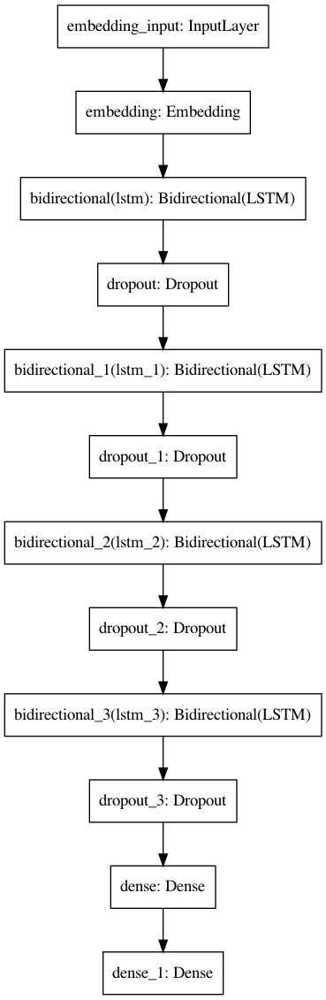

In [103]:
plot_model(bi_lstm_model)

In [104]:
y = training_dataset[comment_column_names].values

In [105]:
bi_lstm_model.fit(X_train_padded, y, batch_size=32, epochs=5, validation_split=0.2, callbacks=[callback])

Epoch 1/5
3990/3990 [==============================] - 1126s 282ms/step - loss: 0.0611 - accuracy: 0.9779 - val_loss: 0.0508 - val_accuracy: 0.9941
Epoch 2/5
3990/3990 [==============================] - 970s 243ms/step - loss: 0.0499 - accuracy: 0.9839 - val_loss: 0.0480 - val_accuracy: 0.9941
Epoch 3/5
3990/3990 [==============================] - 937s 235ms/step - loss: 0.0478 - accuracy: 0.9819 - val_loss: 0.0484 - val_accuracy: 0.9941
Epoch 4/5
3990/3990 [==============================] - 841s 211ms/step - loss: 0.0461 - accuracy: 0.9890 - val_loss: 0.0460 - val_accuracy: 0.9941
Epoch 5/5
3990/3990 [==============================] - 907s 227ms/step - loss: 0.0445 - accuracy: 0.9856 - val_loss: 0.0462 - val_accuracy: 0.7108


In [106]:
y_pred_biLSTM = bi_lstm_model.predict([X_test_padded],verbose=1)

2000/2000 [==============================] - 118s 59ms/step


In [107]:
# transform into a format
bi_lstm_result = list()
for prediction in y_pred_biLSTM:
    temp_list = list()
    for item in prediction:
        if item > float(0.5):
            temp_list.append(1)
        else:
            temp_list.append(0)
    bi_lstm_result.append(temp_list)

In [108]:
print(classification_report(y_test, bi_lstm_result))

              precision    recall  f1-score   support

           0       0.63      0.80      0.70      6090
           1       0.53      0.15      0.23       367
           2       0.73      0.69      0.71      3691
           3       0.00      0.00      0.00       211
           4       0.72      0.54      0.62      3427
           5       0.00      0.00      0.00       712

   micro avg       0.67      0.64      0.66     14498
   macro avg       0.44      0.36      0.38     14498
weighted avg       0.63      0.64      0.63     14498
 samples avg       0.07      0.06      0.06     14498



In [109]:
print('Hamming Loss for Bi-LSTM Classifier is: {:.2f}'.format(hamming_loss(y_test, bi_lstm_result)))

Hamming Loss for Bi-LSTM Classifier is: 0.03


In [110]:
print('Accuracy for Bi-LSTM Classifier is: {:.2f}'.format(accuracy_score(y_test, bi_lstm_result)))

Accuracy for Bi-LSTM Classifier is: 0.89


# RESULT ANALYSIS

<p style="font-size:15px">The table below summarizes the high-level performance of the models on the test dataset. The table's naïve glance suggests that our binary relevance logistic regression model is the best as it has the highest f1-score and comparable accuracy. However, upon analyzing the different models' classification report, we can see that our Logistic Regression and Multinomial Naïve Bayes based model have abysmal classification performance.</p>

<p style="font-size:15px">From the individual classification reports, we can see these classifiers are majority classifiers as they are doing a good work of predicting Class 0 (non-toxic) comments but either overpredict or have a low precision when classifying toxic labels.</p>

<p style="font-size:15px">The deep learning model also has a very low F1-score; however, the accuracy is high. Upon analyzing the classification report of the Bi-LSTM model, we can see that it completely misses two toxic subcategories resulting in a low F1-score. We can attribute this low score to the prevalent class imbalance in our dataset. The class labels were not stratified while doing the training/validation split. However, the performance of the model on the other toxic subcategories is high.</p>

<p style="font-size:15px">Hence, we choose Bi-LSTM model is our best model, whose classification performance can further be enhanced by using data augmentation techniques and stratified splitting.</p>

<br/>





<table>
    <tr>
        <th>Model Name</th><th>Hamming Loss</th><th>F1-Score (Macro Average)</th><th>Accuracy</th>
    </tr>
    <tr>
        <td>OneVsRest Logistic Regression</td><td>0.05</td><td>0.49</td><td>0.84</td>
    </tr>
    <tr>
        <td>OneVsRest Multinomial Naïve Bayes</td><td>0.04</td><td>0.03</td><td>0.90</td>
    </tr>
    <tr>
        <td>Binary Relevance Logistic Regression</td><td>0.03</td><td>0.53</td><td>0.88</td>
    </tr>
    <tr>
        <td>Binary Relevance Multinomial Naïve Bayes</td><td>0.03</td><td>0.38</td><td>0.90</td>
    </tr>
    <tr>
        <td>Classifier Chain Logistic Regression</td><td>0.03</td><td>0.52</td><td>0.88</td>
    </tr>
    <tr>
        <td>Classifier Chain Multinomial Naïve Bayes</td><td>0.06</td><td>0.39</td><td>0.85</td>
    </tr>
    <tr>
        <td>Bi-LSTM Neural Network</td><td>0.03</td><td>0.38</td><td>0.89</td>
    </tr>
</table>

# SUMMARY

<p style="font-size:14px">To summarize, through this project, we learned how multi-label classification works and its available methods. The machine learning concepts and algorithms such as classification, Naïve Bayes, Neural Networks, NLP techniques learned during our class helped us with the execution of the project, and we were able to apply them according to build the models and evaluate their performance. The best model (Bi-LSTM) is a good baseline model that could be employed to classify specific toxic subcategories. However, it requires additional training for the categories which have fewer data points.</p>